In [1]:
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE


In [2]:
df = pd.read_csv('dataset/data.csv')

In [3]:
df.head(4)

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,statezip,country
0,2014-05-02 00:00:00,313000.0,3.0,1.50,1340,7912,1.5,0,0,3,1340,0,1955,2005,18810 Densmore Ave N,Shoreline,WA 98133,USA
1,2014-05-02 00:00:00,2384000.0,5.0,2.50,3650,9050,2.0,0,4,5,3370,280,1921,0,709 W Blaine St,Seattle,WA 98119,USA
2,2014-05-02 00:00:00,342000.0,3.0,2.00,1930,11947,1.0,0,0,4,1930,0,1966,0,26206-26214 143rd Ave SE,Kent,WA 98042,USA
3,2014-05-02 00:00:00,420000.0,3.0,2.25,2000,8030,1.0,0,0,4,1000,1000,1963,0,857 170th Pl NE,Bellevue,WA 98008,USA


In [4]:
df.isna().sum()

date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
street           0
city             0
statezip         0
country          0
dtype: int64

In [5]:
df.describe().style.background_gradient(cmap = 'rainbow')

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated
count,4600.000000,4600.000000,4600.000000,4600.000000,4600.000000,4600.000000,4600.000000,4600.000000,4600.000000,4600.000000,4600.000000,4600.000000,4600.000000
mean,551962.988473,3.400870,2.160815,2139.346957,14852.516087,1.512065,0.007174,0.240652,3.451739,1827.265435,312.081522,1970.786304,808.608261
std,563834.702547,0.908848,0.783781,963.206916,35884.436145,0.538288,0.084404,0.778405,0.677230,862.168977,464.137228,29.731848,979.414536
min,0.000000,0.000000,0.000000,370.000000,638.000000,1.000000,0.000000,0.000000,1.000000,370.000000,0.000000,1900.000000,0.000000
25%,322875.000000,3.000000,1.750000,1460.000000,5000.750000,1.000000,0.000000,0.000000,3.000000,1190.000000,0.000000,1951.000000,0.000000
50%,460943.461539,3.000000,2.250000,1980.000000,7683.000000,1.500000,0.000000,0.000000,3.000000,1590.000000,0.000000,1976.000000,0.000000
75%,654962.500000,4.000000,2.500000,2620.000000,11001.250000,2.000000,0.000000,0.000000,4.000000,2300.000000,610.000000,1997.000000,1999.000000
max,26590000.000000,9.000000,8.000000,13540.000000,1074218.000000,3.500000,1.000000,4.000000,5.000000,9410.000000,4820.000000,2014.000000,2014.000000


In [6]:
df.dtypes

date              object
price            float64
bedrooms         float64
bathrooms        float64
sqft_living        int64
sqft_lot           int64
floors           float64
waterfront         int64
view               int64
condition          int64
sqft_above         int64
sqft_basement      int64
yr_built           int64
yr_renovated       int64
street            object
city              object
statezip          object
country           object
dtype: object

## Data Processing

In [7]:
numer_ = df.select_dtypes(include = np.number)
numer_

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated
0,3.130000e+05,3.0,1.50,1340,7912,1.5,0,0,3,1340,0,1955,2005
1,2.384000e+06,5.0,2.50,3650,9050,2.0,0,4,5,3370,280,1921,0
2,3.420000e+05,3.0,2.00,1930,11947,1.0,0,0,4,1930,0,1966,0
3,4.200000e+05,3.0,2.25,2000,8030,1.0,0,0,4,1000,1000,1963,0
4,5.500000e+05,4.0,2.50,1940,10500,1.0,0,0,4,1140,800,1976,1992
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4595,3.081667e+05,3.0,1.75,1510,6360,1.0,0,0,4,1510,0,1954,1979
4596,5.343333e+05,3.0,2.50,1460,7573,2.0,0,0,3,1460,0,1983,2009
4597,4.169042e+05,3.0,2.50,3010,7014,2.0,0,0,3,3010,0,2009,0
4598,2.034000e+05,4.0,2.00,2090,6630,1.0,0,0,3,1070,1020,1974,0


In [8]:
report = ProfileReport(df , title = 'Insight Housing Data set ' , explorative = True)
report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [19]:
AV = AutoViz_Class()
report2 = AV.AutoViz(
    filename = df ,
    sep = ',')

Shape of your Data Set loaded: (4600, 18)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  4
    Number of Integer-Categorical Columns =  7
    Number of String-Categorical Columns =  4
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  1
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  1
    Number of ID Columns =  0
    Number of Columns to Delete =  1
    18 Predictors classified...
        1 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['country']
To fix these data quality issues in the dataset, import 

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
date,object,0.000000,1,,,23 rare categories: Too many to list. Group them into a single category or drop the categories.
price,float64,0.000000,NA,0.000000,26590000.000000,Column has 240 outliers greater than upper bound (1153093.75) or lower than lower bound(-175256.25). Cap them or remove them.
bedrooms,float64,0.000000,NA,0.000000,9.000000,Column has 118 outliers greater than upper bound (5.50) or lower than lower bound(1.50). Cap them or remove them.
bathrooms,float64,0.000000,NA,0.000000,8.000000,Column has 141 outliers greater than upper bound (3.62) or lower than lower bound(0.62). Cap them or remove them.
sqft_living,int64,0.000000,12,370.000000,13540.000000,Column has 129 outliers greater than upper bound (4360.00) or lower than lower bound(-280.00). Cap them or remove them.
sqft_lot,int64,0.000000,67,638.000000,1074218.000000,Column has 541 outliers greater than upper bound (20002.00) or lower than lower bound(-4000.00). Cap them or remove them.
floors,float64,0.000000,NA,1.000000,3.500000,No issue
waterfront,int64,0.000000,0,0.000000,1.000000,No issue
view,int64,0.000000,0,0.000000,4.000000,Column has 460 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.
condition,int64,0.000000,0,1.000000,5.000000,Column has 6 outliers greater than upper bound (5.50) or lower than lower bound(1.50). Cap them or remove them.


Number of All Scatter Plots = 10
All Plots done
Time to run AutoViz = 7 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [44]:
df.columns

Index(['date', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'street', 'city',
       'statezip', 'country'],
      dtype='object')

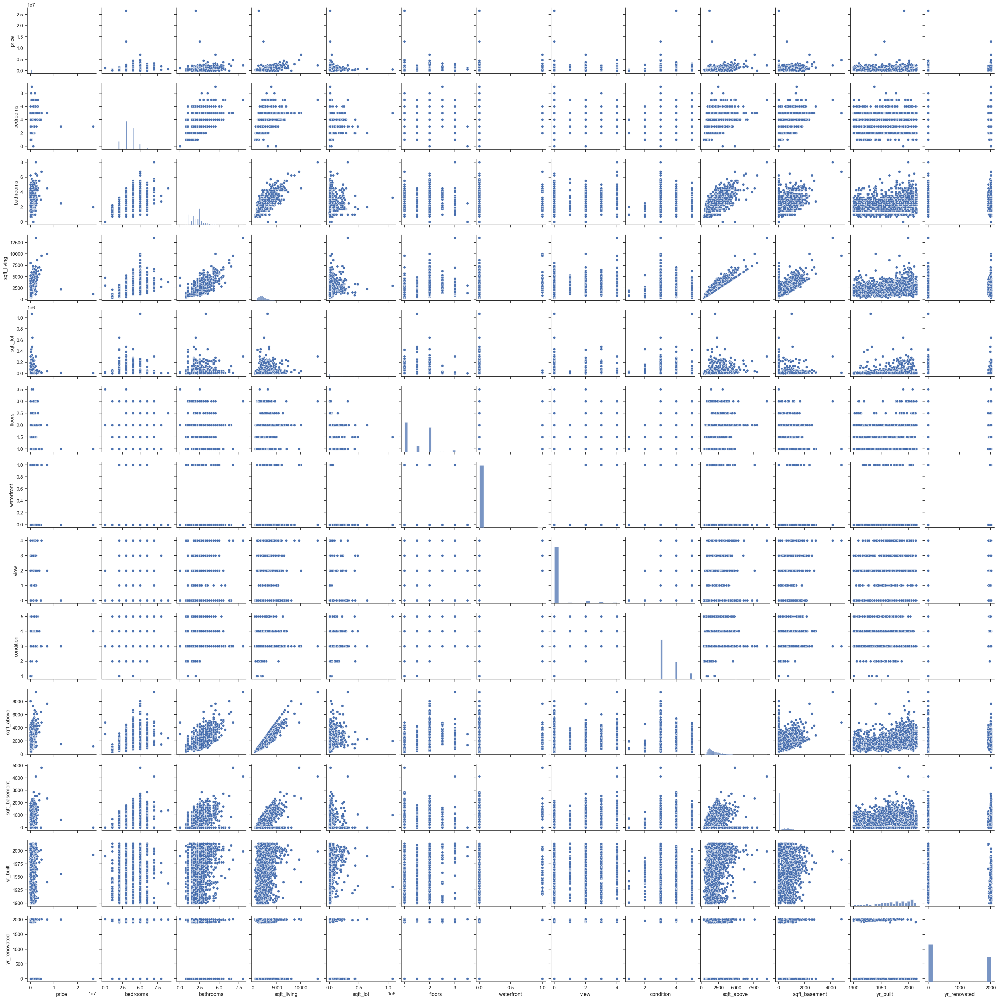

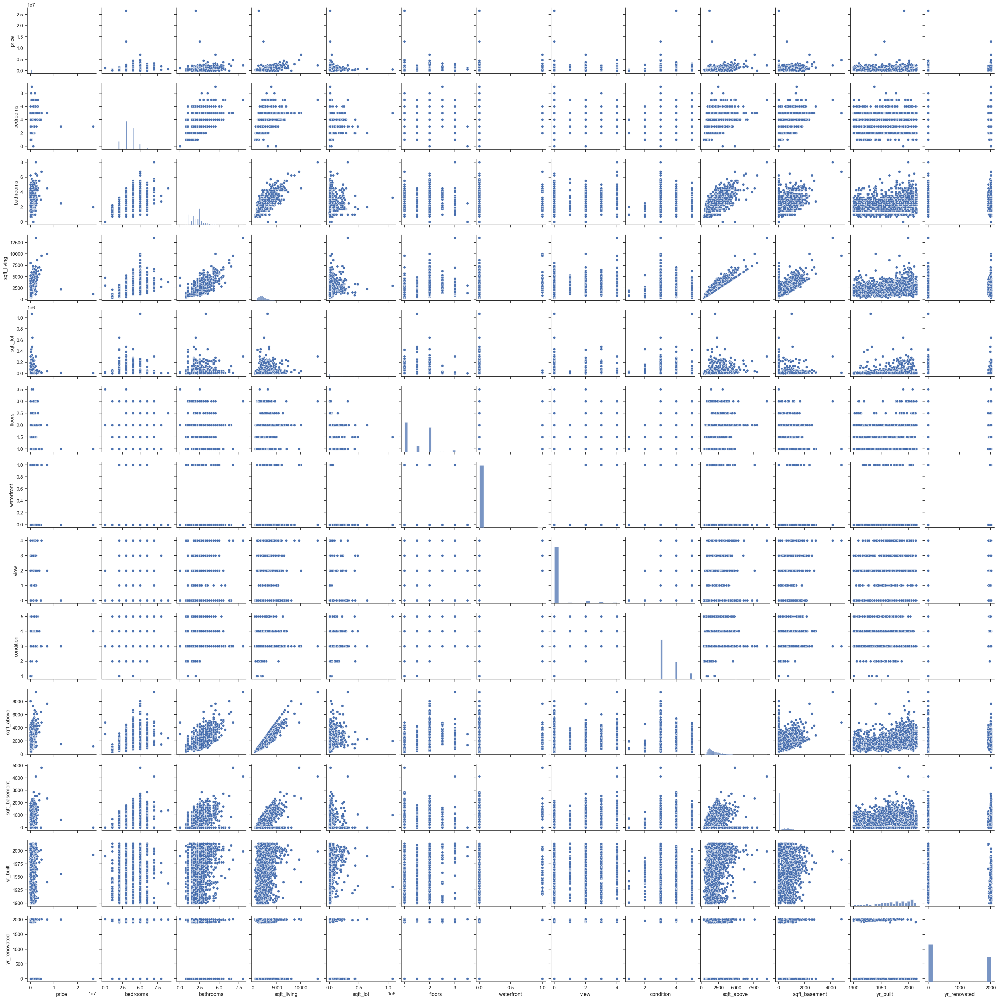

In [10]:
sns.pairplot(df)

In [8]:
df.columns

Index(['date', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'street', 'city',
       'statezip', 'country'],
      dtype='object')

In [9]:
numeric_ = df.select_dtypes(include = 'number')

In [10]:
def detect_outlier(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    print(f"Outliers in column '{column}': {len(outliers)}")  # Print count of outliers
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]


In [11]:
number_column = df[['price','bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot','view','sqft_above',
       'sqft_basement']]

In [12]:
df_cleaned = df.copy()

# Remove outliers column by column
for column in number_column:
    df_cleaned = detect_outlier(df_cleaned, column)

print("Shape after removing outliers:", df_cleaned.shape)


Outliers in column 'price': 240
Outliers in column 'bedrooms': 100
Outliers in column 'bathrooms': 66
Outliers in column 'sqft_living': 57
Outliers in column 'sqft_lot': 460
Outliers in column 'view': 240
Outliers in column 'sqft_above': 68
Outliers in column 'sqft_basement': 50
Shape after removing outliers: (3319, 18)


In [8]:
def detect_outlier_rows(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outlier_rows = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return outlier_rows
outlier_dataframes = []
for column in number_column:
    outliers_in_column = detect_outlier_rows(df, column)
    outliers_in_column['Outlier_Column'] = column  # Label the outlier column
    outlier_dataframes.append(outliers_in_column)
all_outliers_df = pd.concat(outlier_dataframes).drop_duplicates()
outliers = pd.DataFrame(all_outliers_df)



C:\Users\seyhak jr\AppData\Local\Temp\ipykernel_2516\37472799.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  outliers_in_column['Outlier_Column'] = column  # Label the outlier column
C:\Users\seyhak jr\AppData\Local\Temp\ipykernel_2516\37472799.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  outliers_in_column['Outlier_Column'] = column  # Label the outlier column
C:\Users\seyhak jr\AppData\Local\Temp\ipykernel_2516\37472799.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of

In [13]:
outliers.shape

(1827, 19)

In [18]:
outliers.to_csv('outliers.csv1')

In [13]:
df_cleaned.describe()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated
count,3.319000e+03,3319.000000,3319.000000,3319.000000,3319.000000,3319.00000,3319.0,3319.0,3319.000000,3319.000000,3319.000000,3319.000000,3319.000000
mean,4.467042e+05,3.260922,1.996384,1836.681832,7028.952094,1.49081,0.0,0.0,3.449834,1602.306116,234.375716,1970.339259,808.689063
std,1.929441e+05,0.771330,0.647992,619.881562,3415.411084,0.54526,0.0,0.0,0.669088,614.285058,355.257625,30.292128,979.337083
min,0.000000e+00,2.000000,0.750000,580.000000,681.000000,1.00000,0.0,0.0,1.000000,580.000000,0.000000,1900.000000,0.000000
25%,3.000000e+05,3.000000,1.500000,1360.000000,4624.000000,1.00000,0.0,0.0,3.000000,1130.000000,0.000000,1950.000000,0.000000
50%,4.150000e+05,3.000000,2.000000,1780.000000,7035.000000,1.50000,0.0,0.0,3.000000,1440.000000,0.000000,1973.000000,0.000000
75%,5.600000e+05,4.000000,2.500000,2250.000000,9044.500000,2.00000,0.0,0.0,4.000000,1980.000000,490.000000,1998.000000,1999.000000
max,1.150000e+06,5.000000,3.500000,3910.000000,18362.000000,3.50000,0.0,0.0,5.000000,3340.000000,1250.000000,2014.000000,2014.000000


In [14]:
df_cleaned = df_cleaned[df_cleaned['bathrooms'] > 0.99]
df_cleaned.price = df_cleaned.price.apply(lambda x: int(x))



In [15]:
quan_col = df.select_dtypes(include = 'number')
quan_col1 = df_cleaned.select_dtypes(include = 'number')

In [11]:
df_quan = quan_col.columns[:-1]
clean_quan = quan_col1.columns[:-1]

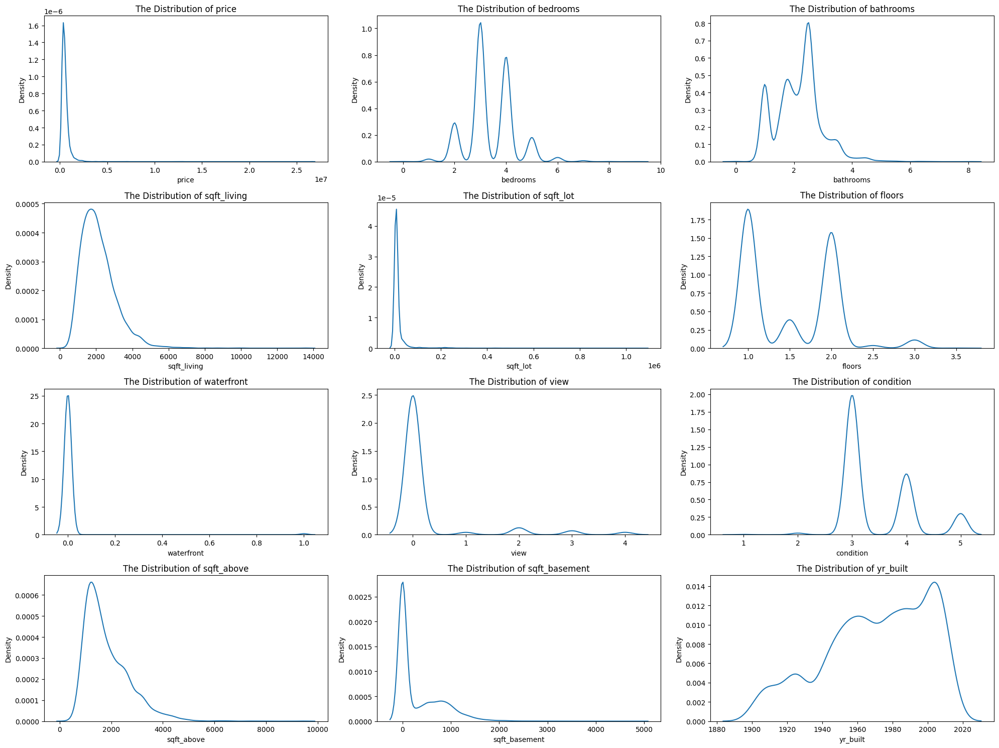

In [20]:
import seaborn as sns
_, ax = plt.subplots(4,3, figsize =(20,15))
ax = ax.flatten()
for i , var in enumerate(df_quan):
    sns.kdeplot(data = df , x = var , ax = ax[i])
    ax[i].set_title(f'The Distribution of {var}')
plt.tight_layout()
plt.show()


C:\Users\seyhak jr\AppData\Local\Temp\ipykernel_20272\977312562.py:4: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data = df_cleaned , x = va , ax = ax[i] , color = 'blue')
C:\Users\seyhak jr\AppData\Local\Temp\ipykernel_20272\977312562.py:4: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data = df_cleaned , x = va , ax = ax[i] , color = 'blue')


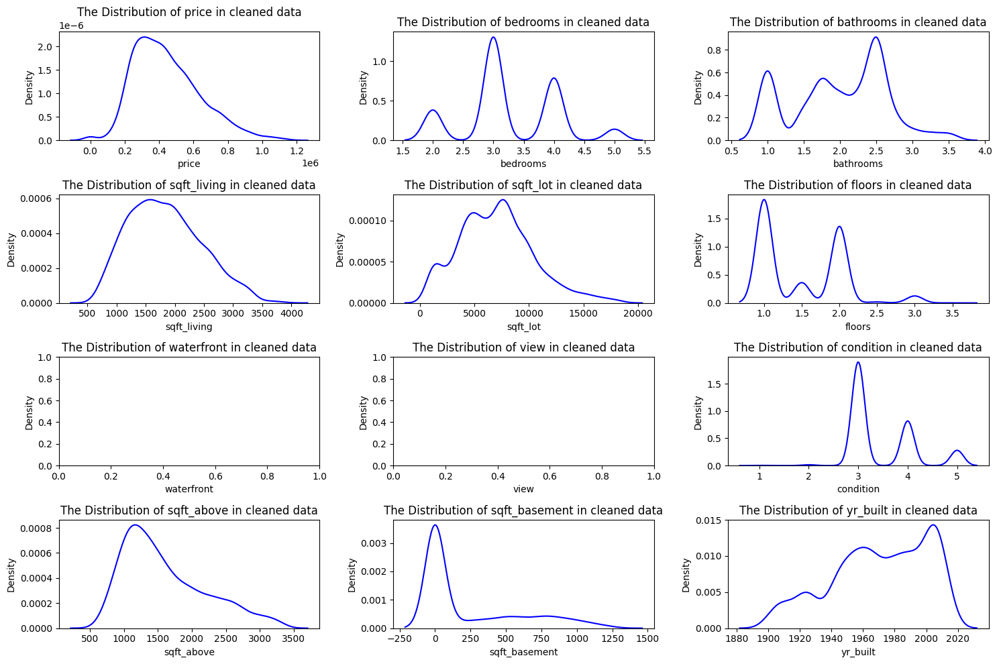

In [21]:
_, ax = plt.subplots(4,3 , figsize =(15,10))
ax = ax.flatten()
for i , va in enumerate(clean_quan):
    sns.kdeplot(data = df_cleaned , x = va , ax = ax[i] , color = 'blue')
    ax[i].set_title(f'The Distribution of {va} in cleaned data')

plt.tight_layout()
plt.show()

In [12]:
 df_cleaned = df_cleaned.drop(['waterfront','view'], axis =1)

In [16]:
df_cleaned.to_csv('Clean_data.csv')

In [13]:
price_year = df_cleaned.groupby(['yr_built','yr_renovated']).agg({
    'date':'count',
}).reset_index()
price_year

,yr_built,yr_renovated,date
0,1900,1955,1
1,1900,1971,3
2,1900,1988,1
3,1900,2000,1
4,1900,2003,1
...,...,...,...
286,2010,0,23
287,2011,0,22
288,2012,1912,29
289,2013,1923,40


In [24]:
df_cleaned.columns

Index(['date', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'condition', 'sqft_above', 'sqft_basement', 'yr_built',
       'yr_renovated', 'street', 'city', 'statezip', 'country'],
      dtype='object')

In [25]:
df_cleaned.duplicated().sum()

0

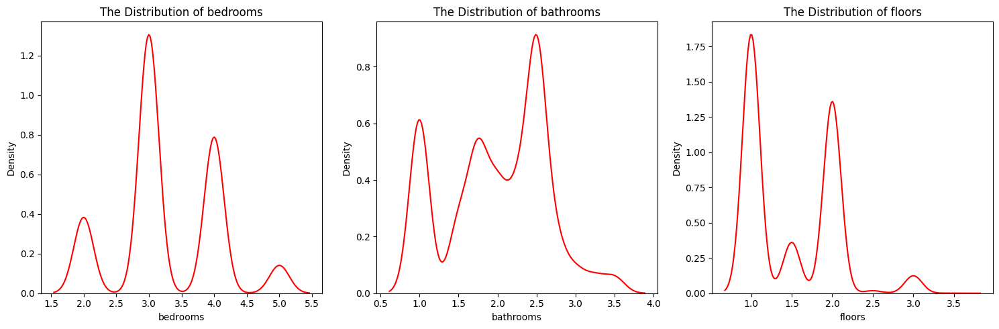

In [26]:
# price_ = df_cleaned.groupby(['bedrooms','bathrooms','floors']).count().sort_values('price')
# price_
feature = df_cleaned[['bedrooms','bathrooms','floors']]
features = feature.columns
ax = ax.flatten()
_, ax = plt.subplots(1,3 , figsize = (15,5))
for i , va in enumerate(features):
    sns.kdeplot( data = df_cleaned , x = va , ax = ax[i] , color = 'red')
    ax[i].set_title(f'The Distribution of {va}')
plt.tight_layout()
plt.show()
    

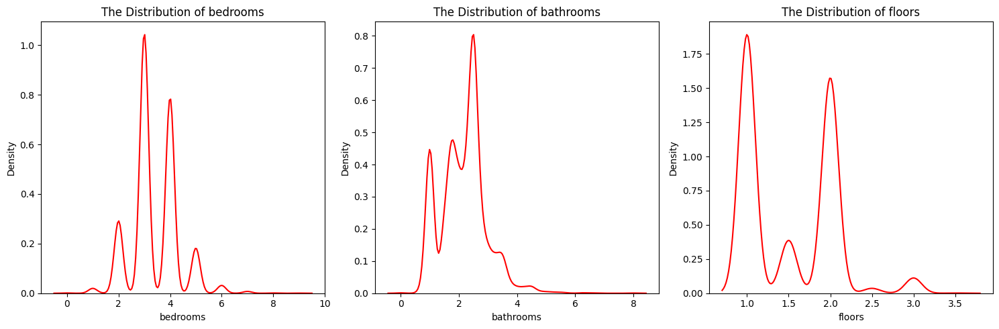

In [27]:
feature = df[['bedrooms','bathrooms','floors']]
features = feature.columns
ax = ax.flatten()
_, ax = plt.subplots(1,3 , figsize = (15,5))
for i , va in enumerate(features):
    sns.kdeplot( data = df , x = va , ax = ax[i] , color = 'red')
    ax[i].set_title(f'The Distribution of {va}')
plt.tight_layout()
plt.show()

## Price Analysis

## 1. Price vs. Bedrooms, Bathrooms, and Floors

Text(0.5, 0, 'floors')

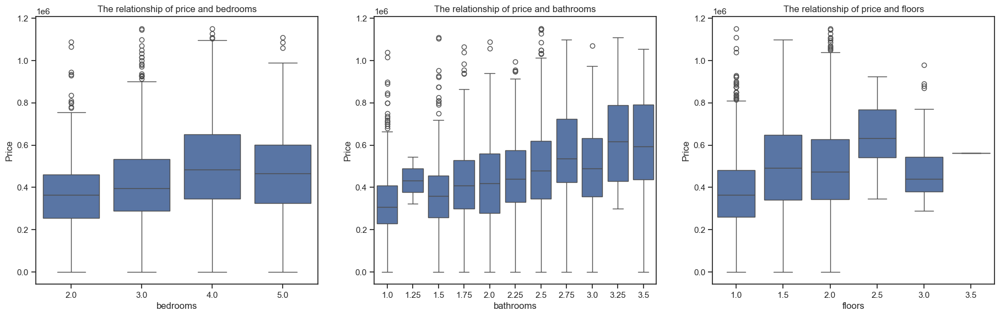

In [49]:
fig , axes = plt.subplots(1,3, figsize = (20,6))

sns.boxplot( data = df_cleaned ,x = 'bedrooms',y = 'price' , ax = axes[0])
axes[0].set_title('The relationship of price and bedrooms')
axes[0].set_ylabel('Price')
axes[0].set_xlabel('bedrooms')

sns.boxplot( data = df_cleaned , x = 'bathrooms' , y = 'price' , ax = axes[1])
axes[1].set_title('The relationship of price and bathrooms')
axes[1].set_ylabel('Price')
axes[1].set_xlabel('bathrooms')

sns.boxplot( data = df_cleaned  , x = 'floors' , y = 'price', ax = axes[2])
axes[2].set_title('The relationship of price and floors')
axes[2].set_ylabel('Price')
axes[2].set_xlabel('floors')

## Does Renovation Affect Price?

In [28]:
df_cleaned['renovated'] = df_cleaned['yr_renovated'].apply(lambda x : 'renovated' if x > 0 else 'not renovated')

<Axes: xlabel='renovated', ylabel='price'>

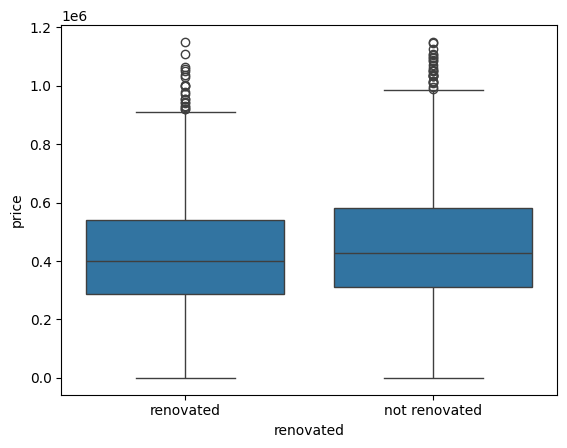

In [29]:
from scipy.stats import ttest_ind
sns.boxplot(data = df_cleaned , x = 'renovated' , y = 'price')

In [60]:

# renovated_prices = df_cleaned[df_cleaned['renovated'] == 'Renovated']['price']
# non_renovated_prices = df_cleaned[df_cleaned['renovated']== 'Not Renovated']['price']
# t_stat, p_value = ttest_ind(renovated_prices, non_renovated_prices)
# print(f"T-statistic: {t_stat}, P-value: {p_value}")


## 3. Size and Lot Features

##  Relationship Between sqft_living and House Prices

             sqft_living    price 
sqft_living   1.000000    0.542396
price         0.542396    1.000000


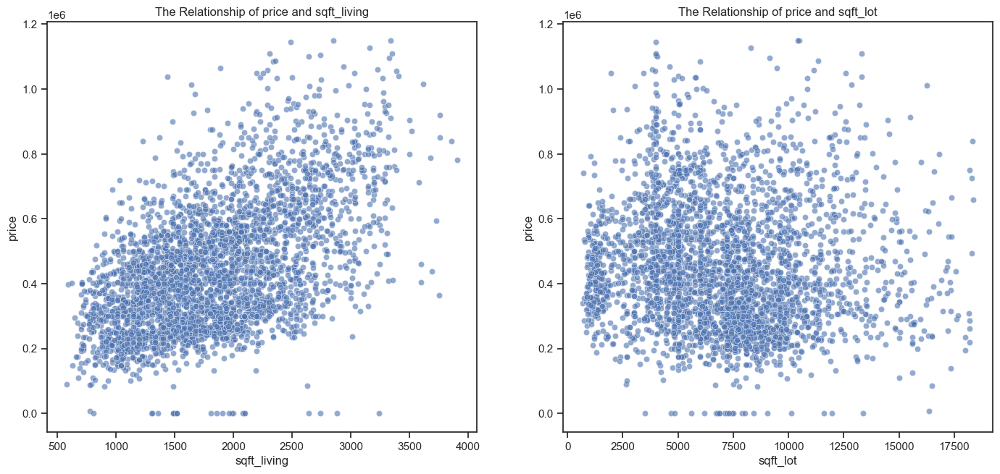

In [88]:

fig, axes= plt.subplots(1,2, figsize=(15,7))
sns.scatterplot(data = df_cleaned , x = 'sqft_living', y = 'price'  , ax=axes[0],alpha = 0.6)
axes[0].set_title('The Relationship of price and sqft_living')

sns.scatterplot(data = df_cleaned , x = 'sqft_lot', y = 'price'  ,ax=axes[1], alpha = 0.6)
axes[1].set_title('The Relationship of price and sqft_lot')

correlation = df_cleaned[['sqft_living','price']].corr()
print(correlation)

## Relationship Between sqft_lot and House Prices

<Axes: >

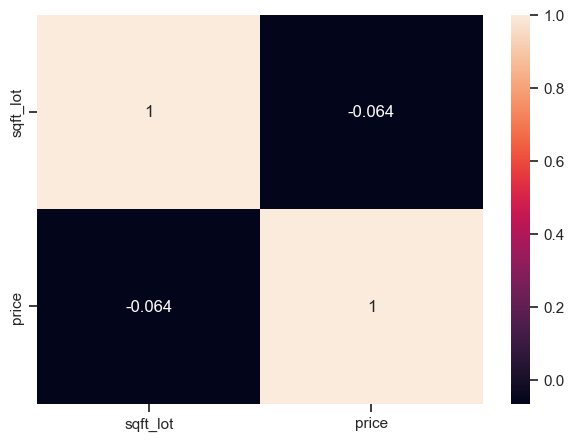

In [76]:
correlation_sqft_price = df_cleaned[['sqft_lot','price']].corr()

sns.heatmap(correlation_sqft_price , annot = True)

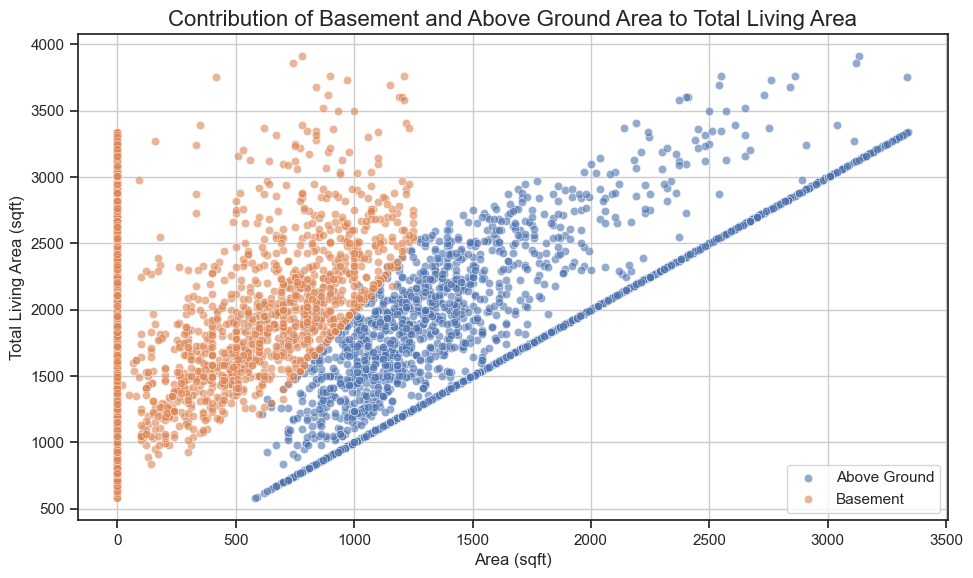

Correlation between Above Ground Area and Total Living Area: 0.83
Correlation between Basement Area and Total Living Area: 0.30


In [81]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='sqft_above', y='sqft_living', data=df_cleaned, alpha=0.6, label='Above Ground')
sns.scatterplot(x='sqft_basement', y='sqft_living', data=df_cleaned, alpha=0.6, label='Basement')
plt.title('Contribution of Basement and Above Ground Area to Total Living Area', fontsize=16)
plt.xlabel('Area (sqft)', fontsize=12)
plt.ylabel('Total Living Area (sqft)', fontsize=12)
plt.legend()
plt.grid(True)
plt.show()
correlation_above_living = df_cleaned[['sqft_above', 'sqft_living']].corr().iloc[0, 1]
correlation_basement_living = df_cleaned[['sqft_basement', 'sqft_living']].corr().iloc[0, 1]
print(f"Correlation between Above Ground Area and Total Living Area: {correlation_above_living:.2f}")
print(f"Correlation between Basement Area and Total Living Area: {correlation_basement_living:.2f}")


## 4. Time-Based Trends

In [30]:
df_cleaned.date = pd.to_datetime(df_cleaned.date)
df_cleaned['month'] = df_cleaned['date'].dt.to_period('M')

In [16]:
# sns.lineplot(data=df_cleaned, x='month', y='price')
# plt.title('House Price Trends Over Time')
# plt.xticks(rotation=45)
# plt.xlabel('Month')
# plt.ylabel('Price')
# plt.show()


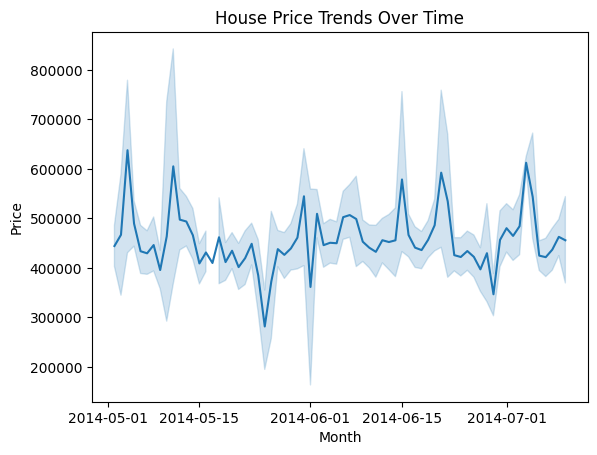

In [31]:
sns.lineplot(data=df_cleaned, x='date', y='price')
plt.title('House Price Trends Over Time')
plt.xlabel('Month')
plt.ylabel('Price')
plt.show()


# Are newer houses (yr_built) more expensive than older houses?

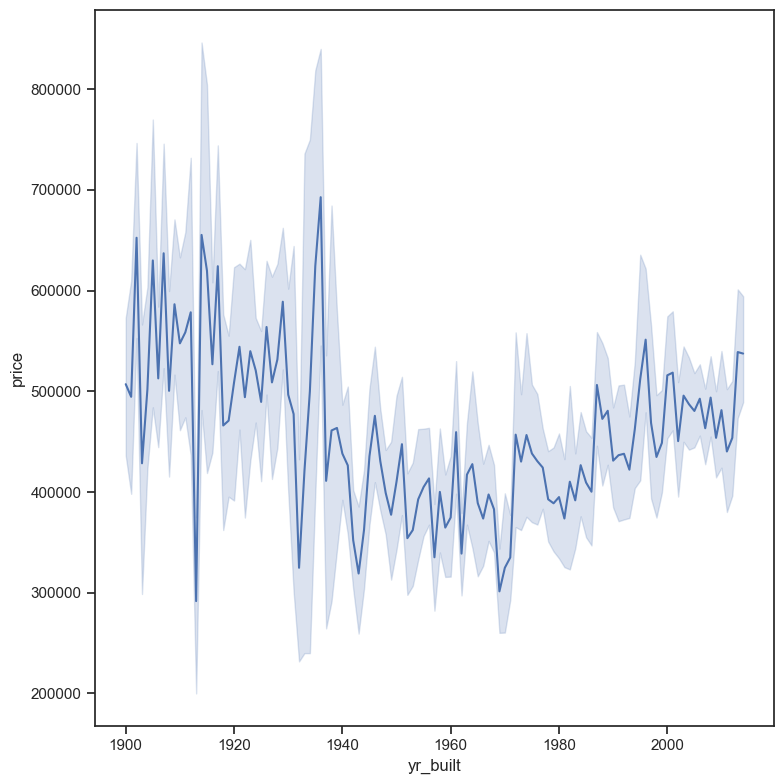

In [118]:
plt.figure(figsize = (8,8))
sns.lineplot( data = df_cleaned , x = 'yr_built', y = 'price' )
plt.tight_layout()
plt.show()

## 5. Geographic Analysis

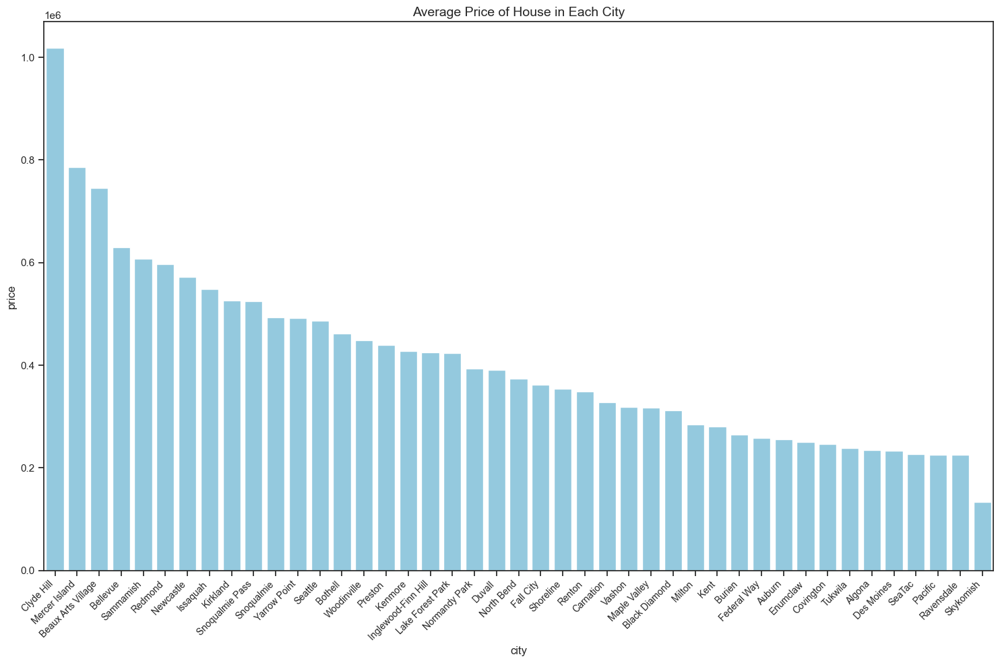

In [117]:
average_price = df_cleaned.groupby('city').agg({
    'price':'mean',
}).reset_index().sort_values('price', ascending = False)
plt.figure(figsize=(15,10))
sns.barplot(average_price , x = 'city', y = 'price' , color = 'skyblue')
plt.title('Average Price of House in Each City', fontsize = 14)
plt.xticks(rotation = 45, ha = 'right' , fontsize = 10)
plt.tight_layout()
plt.show()

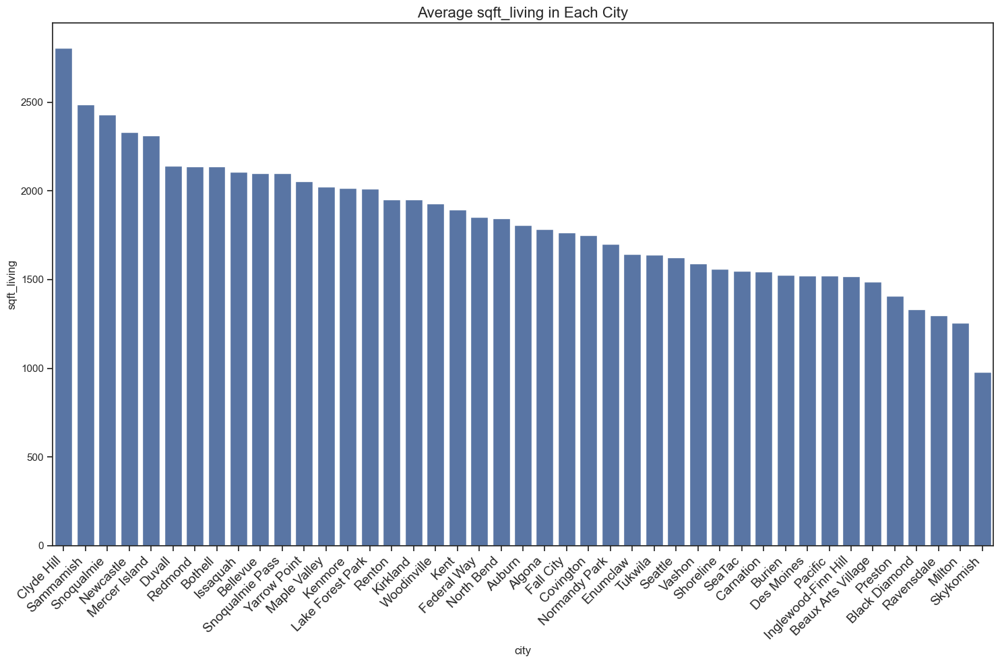

In [133]:
avg_sqft_city = df_cleaned.groupby('city')['sqft_living'].mean().sort_values(ascending = False)
plt.figure(figsize=(15,10))
sns.barplot(avg_sqft_city)
plt.xticks(rotation = 45 , ha = 'right', fontsize =14)
plt.title('Average sqft_living in Each City' , fontsize = 16)
plt.tight_layout()
plt.show()


## Condition and Features

How does house condition correlate with price? Are houses in better condition more expensive?

<Axes: xlabel='condition', ylabel='price'>

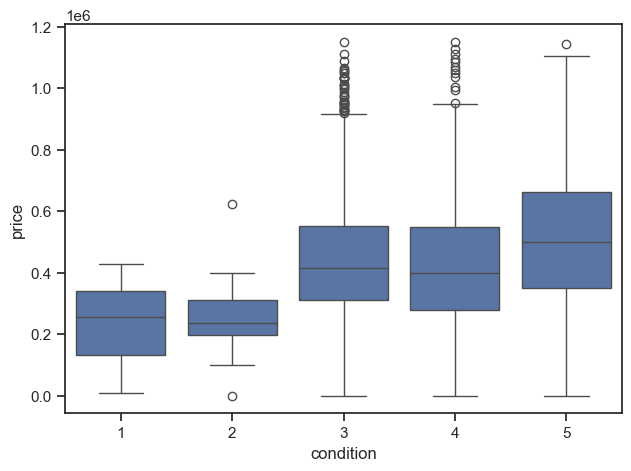

In [140]:
sns.boxplot(data = df_cleaned , x = 'condition' , y = 'price')

<Axes: xlabel='floors', ylabel='price'>

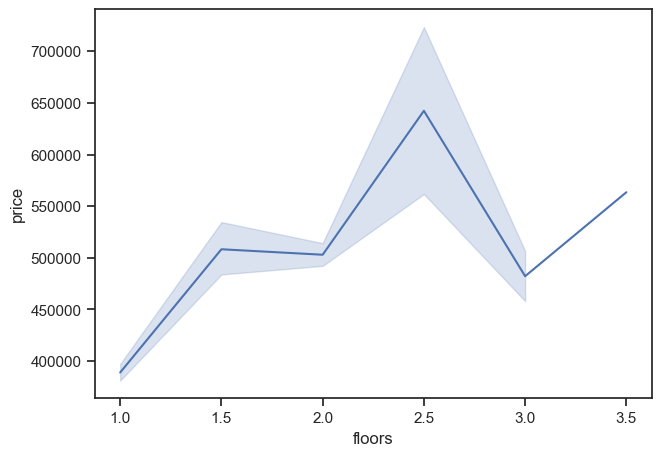

In [142]:
sns.lineplot(data = df_cleaned , x = 'floors' , y = 'price')

In [14]:
df_cleaned['basement'] = df_cleaned['sqft_basement'].apply(lambda x : 'with_basement' if x > 0  else 'without_basement' )

In [15]:
df_cleaned.head(4)

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,statezip,country,basement
0,2014-05-02 00:00:00,313000,3.0,1.50,1340,7912,1.5,3,1340,0,1955,2005,18810 Densmore Ave N,Shoreline,WA 98133,USA,without_basement
2,2014-05-02 00:00:00,342000,3.0,2.00,1930,11947,1.0,4,1930,0,1966,0,26206-26214 143rd Ave SE,Kent,WA 98042,USA,without_basement
3,2014-05-02 00:00:00,420000,3.0,2.25,2000,8030,1.0,4,1000,1000,1963,0,857 170th Pl NE,Bellevue,WA 98008,USA,with_basement
4,2014-05-02 00:00:00,550000,4.0,2.50,1940,10500,1.0,4,1140,800,1976,1992,9105 170th Ave NE,Redmond,WA 98052,USA,with_basement


<Axes: xlabel='basement', ylabel='price'>

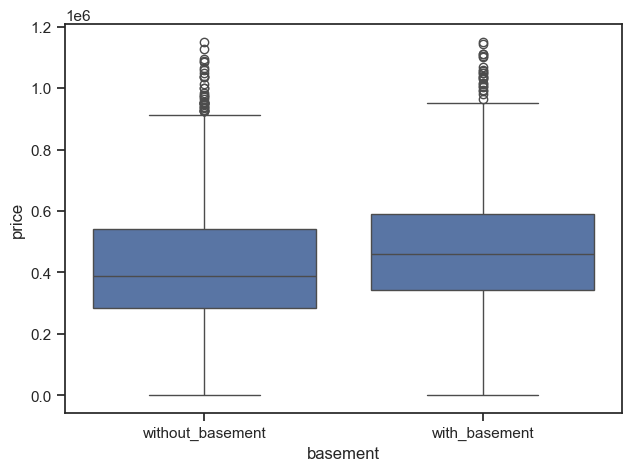

In [153]:
sns.boxplot(data = df_cleaned , x = 'basement' , y = 'price')

## Correlations


What features have the strongest correlation with house price?


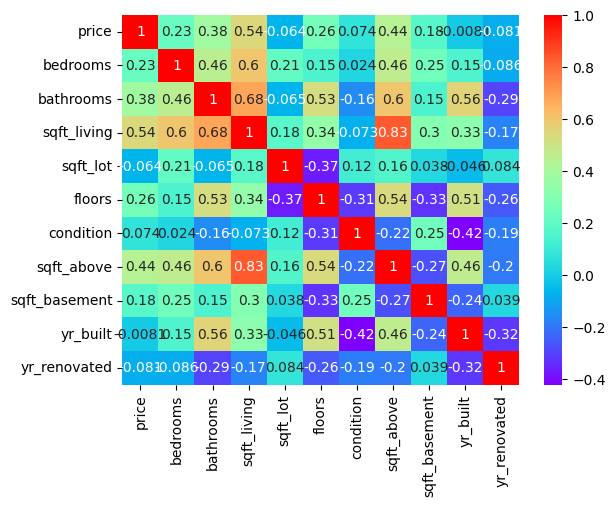

In [17]:
import seaborn as sns
numeric = df_cleaned.select_dtypes(include = 'number')
corr = numeric.corr()
correlation = sns.heatmap(corr , annot = True , cmap = 'rainbow')

In [162]:
idice = corr.copy().to_numpy()
high = np.where((idice > 0.5) & (idice< 1) | (idice <= -0.5))
for i , j in zip(*high):
    print(corr.index[i] , corr.columns[j] , idice[i,j])

price sqft_living 0.5423961721291605
bedrooms sqft_living 0.5998328252142505
bathrooms sqft_living 0.6781869673540869
bathrooms floors 0.5280626483487253
bathrooms sqft_above 0.5996362266633527
bathrooms yr_built 0.5600243206865732
sqft_living price 0.5423961721291605
sqft_living bedrooms 0.5998328252142505
sqft_living bathrooms 0.6781869673540869
sqft_living sqft_above 0.8340018276814392
floors bathrooms 0.5280626483487253
floors sqft_above 0.5358693485968528
floors yr_built 0.509076019858606
sqft_above bathrooms 0.5996362266633527
sqft_above sqft_living 0.8340018276814392
sqft_above floors 0.5358693485968528
yr_built bathrooms 0.5600243206865732
yr_built floors 0.509076019858606


<Axes: >

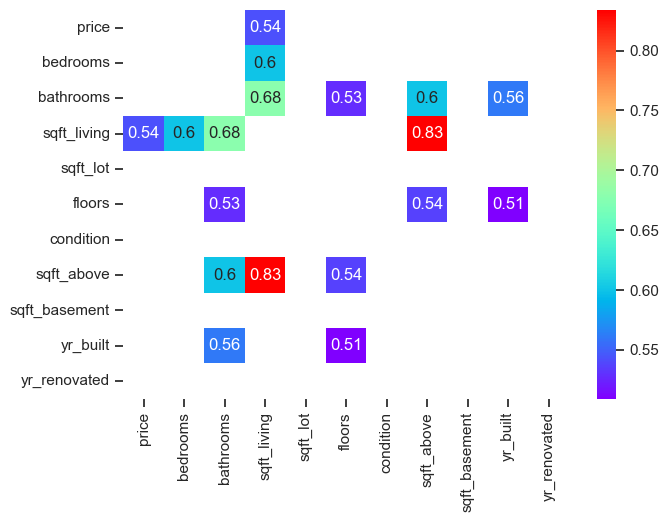

In [169]:
mask = ((corr >0.5) & (corr < 1) | (corr <= -0.5))
filter_corr = corr.where(mask)
sns.heatmap(filter_corr , annot = True , mask = ~mask , cmap = 'rainbow')

In [171]:
corr_sqft = df_cleaned[['sqft_living','sqft_lot']].corr().iloc[0,1]
print(f'The correlated score of sqft living and sqft_lot is {corr_sqft}.2f')

The correlated score of sqft living and sqft_lot is 0.1825940242333048.2f


Are sqft_living and sqft_lot correlated?

## Hypothetical Questions for Decision-Making

In [34]:
df_cleaned['price'] = pd.to_numeric(df_cleaned['price'], errors='coerce')

In [38]:
numeric_cols = ['price', 'sqft_living', 'bedrooms', 'bathrooms', 'floors', 'condition']
df_numeric = df_cleaned[numeric_cols]


In [18]:
high_end_threshold = df_cleaned['price'].quantile(0.80)
high_end_houses = df_cleaned[df_cleaned['price'] >= high_end_threshold]

In [37]:

feature_comparison = df_numeric.groupby(df_numeric['price'] >= high_end_threshold).mean()
print(feature_comparison[['sqft_living', 'bedrooms', 'bathrooms', 'floors', 'condition']])


       sqft_living  bedrooms  bathrooms   floors   condition
price                                                       
False  1691.900795  3.186293  1.906569   1.442067  3.418781 
True   2400.644543  3.551622  2.346239   1.680678  3.570796 


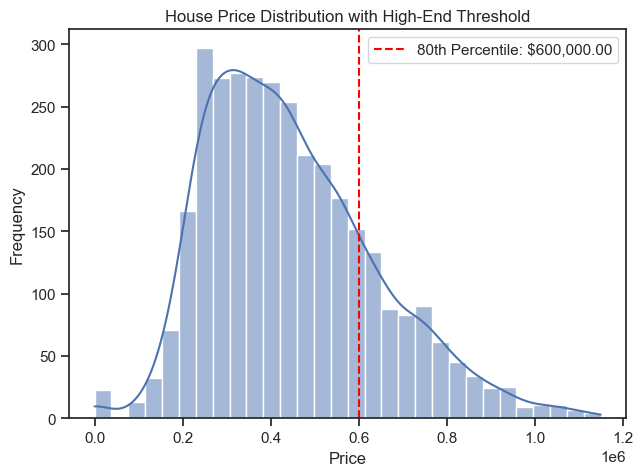

In [39]:
sns.histplot(df_cleaned['price'], kde=True, bins=30)
plt.axvline(high_end_threshold, color='red', linestyle='--', label=f'80th Percentile: ${high_end_threshold:,.2f}')
plt.title('House Price Distribution with High-End Threshold')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.legend()
plt.show()